In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import prf_utils

In [2]:
activePointsList = prf_utils.parseATrace("/Users/giuliostramondo/Projects/H2RC16/rodinia_test_100.atrace")

TotalNumberOfAccesses=0
for i in range(0,len(activePointsList)):
    TotalNumberOfAccesses+=len(activePointsList[i])
print "TotalNumberOfAccesses: "+str(TotalNumberOfAccesses)

row_accesses = []
row_efficiency = []
row_speedup = []
for i in range(35):
    row_accesses.append(0)
    row_efficiency.append(0)
    row_speedup.append(0)
    
for memories in range(1,35):
    TotalParallelAccesses=0
    for i in range(0,len(activePointsList)):
        active_points = list(set(activePointsList[i]))
        #sol = prf_utils.solveOptimally(active_points,2,4, prf_utils.MappingScheme.RECTANGLE_ONLY)
        sol = prf_utils.solveOptimally(active_points,2,memories, [prf_utils.Shape.RECTANGLE])
        TotalParallelAccesses+=len(sol)
    
    print "TotalNumberOfAccesses: "+str(TotalNumberOfAccesses)
    print "TotalParallelAccesses: "+str(TotalParallelAccesses)+" with "+str(memories)+" memories"
    row_accesses[memories]=TotalParallelAccesses
    row_efficiency[memories]=TotalNumberOfAccesses/float(TotalParallelAccesses*memories)
    row_speedup[memories]=TotalNumberOfAccesses/float(TotalParallelAccesses)

TotalNumberOfAccesses: 21171
((0, 0),)
((0, 1),)
((0, 2),)
((0, 3),)
((0, 4),)
((0, 5),)
((0, 6),)
((0, 7),)
((0, 8),)
((0, 9),)
((0, 10),)
((0, 11),)
((0, 12),)
((0, 13),)
((0, 14),)
((0, 15),)
((0, 16),)
((0, 17),)
((0, 18),)
((0, 19),)
((0, 20),)
((0, 21),)
((0, 22),)
((0, 23),)
((0, 24),)
((0, 25),)
((0, 26),)
((0, 27),)
((0, 28),)
((0, 29),)
((0, 30),)
((0, 31),)
((0, 32),)
((0, 33),)
((0, 34),)
((100, 0), (101, 0))
((100, 1),)
((100, 2),)
((100, 3),)
((100, 4),)
((100, 5),)
((100, 6), (101, 6))
((100, 7), (101, 7))
((100, 8),)
((100, 9), (101, 9))
((100, 10),)
((100, 11), (101, 11))
((100, 12),)
((100, 13),)
((100, 14), (101, 14))
((100, 15),)
((100, 16),)
((100, 17),)
((100, 18),)
((100, 19), (101, 19))
((100, 20),)
((100, 21),)
((100, 22), (101, 22))
((100, 23), (101, 23))
((100, 24),)
((100, 25), (101, 25))
((100, 26), (101, 26))
((100, 27), (101, 27))
((100, 28),)
((100, 29),)
((100, 30),)
((100, 31), (101, 31))
((100, 32), (101, 32))
((100, 33),)
((100, 34),)
((101, 1), (102

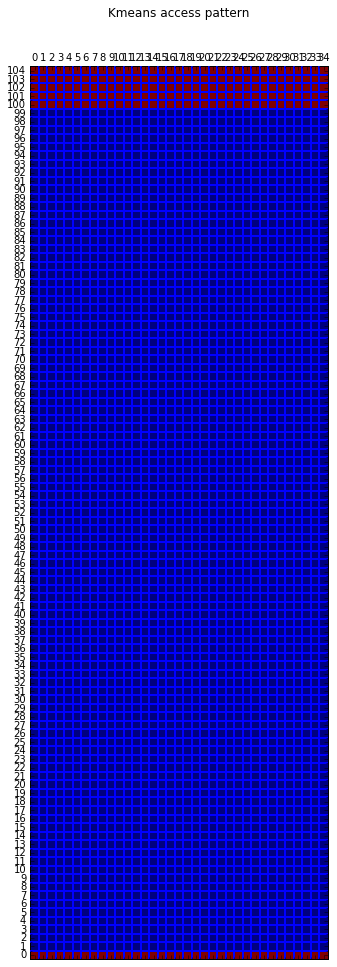

In [17]:
prf_utils.plot_array(prf_utils.create_plane_image((105,35)), active_points, "Kmeans access pattern")

In [1]:
memories = np.arange(0, 35, 1)
plt.plot(memories, row_accesses, 'r.', memories, row_efficiency, 'bs', memories, row_speedup, 'g^')
plt.show()

NameError: name 'np' is not defined

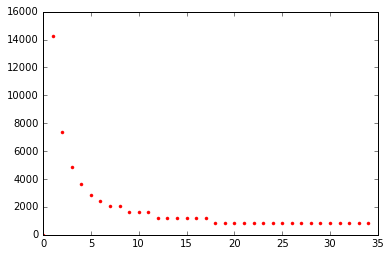

In [5]:
plt.plot(memories, row_accesses, 'r.')

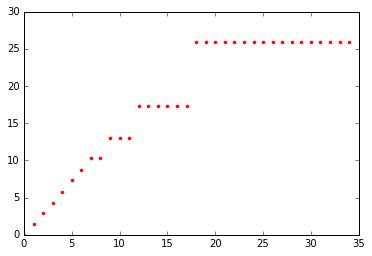

In [6]:
plt.plot(memories, row_speedup, 'r.')

In [16]:
for i in range(1,35):
    row_efficiency[i]=TotalNumberOfAccesses/float(row_accesses[i]*i)

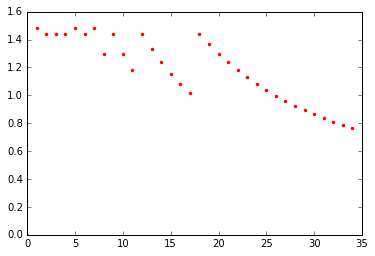

In [7]:
plt.plot(memories, row_efficiency, 'r.')

In [28]:
row_efficiency_over_accesses = []
row_efficiency_over_accesses.append(0)
for i in range(1,35):
    row_efficiency_over_accesses.append(row_efficiency[i]/float(row_accesses[i]))


In [8]:
plt.plot(memories, row_efficiency_over_accesses, 'r.')

NameError: name 'row_efficiency_over_accesses' is not defined

In [41]:
f = open("row_100_kmeans_rectangle.csv","w")
for i in range(1,35):
    if i == 34:
        f.write(str(i)+"\n")
    else:
        f.write(str(i)+",")
for i in range(1,35):
    if i == 34:
        f.write(str(row_accesses[i])+"\n")
    else:
        f.write(str(row_accesses[i])+",")
for i in range(1,35):
    if i == 34:
        f.write(str(row_speedup[i])+"\n")
    else:
        f.write(str(row_speedup[i])+",")
for i in range(1,35):
    if i == 34:
        f.write(str(row_efficiency[i])+"\n")
    else:
        f.write(str(row_efficiency[i])+",")
for i in range(1,35):
    if i == 34:
        f.write(str(row_efficiency_over_accesses[i])+"\n")
    else:
        f.write(str(row_efficiency_over_accesses[i])+",")